In [1]:
from datasets import get_dataset_config_names

domains = get_dataset_config_names("subjqa", trust_remote_code=True)
domains

c:\Users\sshuser\NLP_for_transformers\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


['books', 'electronics', 'grocery', 'movies', 'restaurants', 'tripadvisor']

In [2]:
from datasets import load_dataset

# Load the subjqa dataset with trust_remote_code=True
subjqa = load_dataset("subjqa", name="electronics")

In [3]:
subjqa

DatasetDict({
    train: Dataset({
        features: ['domain', 'nn_mod', 'nn_asp', 'query_mod', 'query_asp', 'q_reviews_id', 'question_subj_level', 'ques_subj_score', 'is_ques_subjective', 'review_id', 'id', 'title', 'context', 'question', 'answers'],
        num_rows: 1295
    })
    test: Dataset({
        features: ['domain', 'nn_mod', 'nn_asp', 'query_mod', 'query_asp', 'q_reviews_id', 'question_subj_level', 'ques_subj_score', 'is_ques_subjective', 'review_id', 'id', 'title', 'context', 'question', 'answers'],
        num_rows: 358
    })
    validation: Dataset({
        features: ['domain', 'nn_mod', 'nn_asp', 'query_mod', 'query_asp', 'q_reviews_id', 'question_subj_level', 'ques_subj_score', 'is_ques_subjective', 'review_id', 'id', 'title', 'context', 'question', 'answers'],
        num_rows: 255
    })
})

In [4]:
subjqa["train"][0]["answers"]

{'text': [],
 'answer_start': [],
 'answer_subj_level': [],
 'ans_subj_score': [],
 'is_ans_subjective': []}

In [5]:
import pandas as pd

dfs = {split: dset.to_pandas() for split, dset in subjqa.flatten().items()}

for split, df in dfs.items():
    print(f"Number of questions in {split}: {df['id'].nunique()}")

Number of questions in train: 1295
Number of questions in test: 358
Number of questions in validation: 255


In [6]:
dfs["train"]

,domain,nn_mod,nn_asp,query_mod,query_asp,q_reviews_id,question_subj_level,ques_subj_score,is_ques_subjective,review_id,id,title,context,question,answers.text,answers.answer_start,answers.answer_subj_level,answers.ans_subj_score,answers.is_ans_subjective
0,electronics,great,bass response,excellent,bass,0514ee34b672623dff659334a25b599b,5,0.50,False,882b1e2745a4779c8f17b3d4406b91c7,2543d296da9766d8d17d040ecc781699,B00001P4ZH,"I have had Koss headphones in the past, Pro 4A...",How is the bass?,[],[],[],[],[]
1,electronics,harsh,high,not strong,bass,7c46670208f7bf5497480fbdbb44561a,1,0.50,False,ce76793f036494eabe07b33a9a67288a,d476830bf9282e2b9033e2bb44bbb995,B00001P4ZH,To anyone who hasn't tried all the various typ...,Is this music song have a goo bass?,"[Bass is weak as expected, Bass is weak as exp...","[1302, 1302]","[1, 1]","[0.5083333, 0.5083333]","[True, True]"
2,electronics,neutral,sound,present,bass,8fbf26792c438aa83178c2d507af5d77,1,0.50,False,d040f2713caa2aff0ce95affb40e12c2,455575557886d6dfeea5aa19577e5de4,B00001P4ZH,I have had many sub-$100 headphones from $5 Pa...,How is the bass?,[The only fault in the sound is the bass],[650],[2],[0.6333333],[True]
3,electronics,muddy,bass,awesome,bass,9876fd06ed8f075fcad70d1e30e7e8be,1,0.50,False,043e7162df91f6ea916c790c8a6f6b22,6895a59b470d8feee0f39da6c53a92e5,B00001WRSJ,My sister's Bose headphones finally died and s...,How is the audio bass?,[the best of all of them],[1609],[1],[0.3],[False]
4,electronics,perfect,bass,incredible,sound,16506b53e2d4c2b6a65881d9462256c2,1,0.65,True,29ccd7e690050e2951be49289e915382,7a2173c502da97c5bd5950eae7cd7430,B00001WRSJ,Wow. Just wow. I'm a 22 yr old with a crazy ob...,Why do I have an incredible sound?,"[The sound is so crisp, crazy obsession with s...","[141, 38]","[1, 1]","[0.40833333, 0.40833333]","[False, False]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1290,electronics,great,impression,rubbery,feel,d4409d6272a7d1d5aa287d6e164bb7d0,1,0.00,False,ebaaec25661c0b21f3e5600a1ed7e30b,e0ea72e711324b5482ec1b36a48f16ee,B00H3OYSHW,I ordered my new NewTrend Airbender Pro NT610K...,Where can I feel my device?,[],[],[],[],[]
1291,electronics,tight,case,great,protection,ed6533390fe2fe0d546b69dea570c34b,5,0.00,False,ebaaec25661c0b21f3e5600a1ed7e30b,ee5906ed3306b7c6d219a40adae2c7c2,B00H3OYSHW,I ordered my new NewTrend Airbender Pro NT610K...,How does the selector protection me?,[],[],[],[],[]
1292,electronics,good,texture,good,grip,22b23446daf9d5bc0140be7278b220ee,1,0.00,False,84efbd9643d7f43af0ea0d2468c7dcc9,a541ffd9697ebf0ad9d226428594128e,B00HNGB1YS,"After using this case for a few days, I have g...",How is the grip?,[],[],[],[],[]
1293,electronics,easy to use,keyboard,removable,keyboard,e7967ad5be0658b4acfca1118f6af1ab,1,0.00,False,e856d7e5351e3385b5d75f06562e905b,7efc5e7ffaa79f53cc50f76a44f9f88e,B00HPM1G8Q,Edit 4/21/14. I finally caved and purchased a ...,How is the keyboard?,"[the keyboard is very easy to use, the keyboar...","[258, 258]","[1, 1]","[1.0, 1.0]","[True, True]"


In [7]:
#hide_output
qa_cols = ["title", "question", "answers.text", 
           "answers.answer_start", "context"]
sample_df = dfs["train"][qa_cols].sample(2, random_state=7)
sample_df

,title,question,answers.text,answers.answer_start,context
791,B005DKZTMG,Does the keyboard lightweight?,[this keyboard is compact],[215],I really like this keyboard. I give it 4 star...
1159,B00AAIPT76,How is the battery?,[],[],I bought this after the first spare gopro batt...


In [8]:
start_idx = sample_df["answers.answer_start"].iloc[0][0]
end_idx = start_idx + len(sample_df["answers.text"].iloc[0][0])
sample_df["context"].iloc[0][start_idx:end_idx]


'this keyboard is compact'

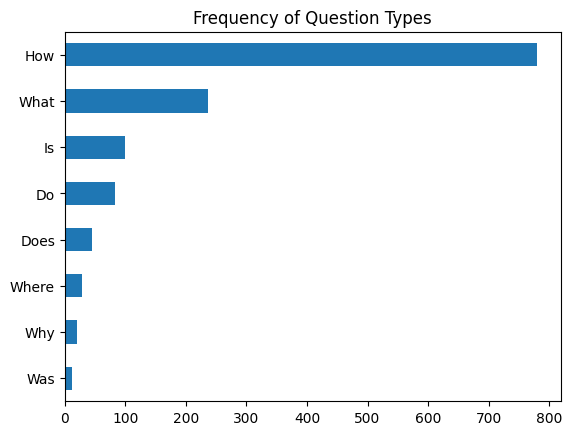

In [9]:
import matplotlib.pyplot as plt

counts = {}
question_types = ["What", "How", "Is", "Does", "Do", "Was", "Where", "Why"]

for q in question_types:
    counts[q] = dfs["train"]["question"].str.startswith(q).value_counts()[True]

pd.Series(counts).sort_values().plot.barh()
plt.title("Frequency of Question Types")
plt.show()

In [10]:
for question_type in ["How", "What", "Is"]:
    for question in (
        dfs["train"][dfs["train"].question.str.startswith(question_type)]
        .sample(n=3, random_state=42)['question']):
        print(question)

How is the camera?
How do you like the control?
How fast is the charger?
What is direction?
What is the quality of the construction of the bag?
What is your impression of the product?
Is this how zoom works?
Is sound clear?
Is it a wireless keyboard?


In [11]:
from transformers import AutoTokenizer

model_ckpt = "deepset/minilm-uncased-squad2"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
     

question = "How much music can this hold?"
context = """An MP3 is about 1 MB/minute, so about 6000 hours depending on \
file size."""
inputs = tokenizer(question, context, return_tensors="pt")

In [12]:
inputs

{'input_ids': tensor([[  101,  2129,  2172,  2189,  2064,  2023,  2907,  1029,   102,  2019,
         23378,  2003,  2055,  1015, 16914,  1013,  3371,  1010,  2061,  2055,
         25961,  2847,  5834,  2006,  5371,  2946,  1012,   102]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1]])}

In [13]:
len(tokenizer.convert_ids_to_tokens(inputs["input_ids"][0]))

28

In [14]:
import torch
from transformers import AutoModelForQuestionAnswering

model = AutoModelForQuestionAnswering.from_pretrained(model_ckpt)

with torch.no_grad():
    outputs = model(**inputs)
print(outputs)

Some weights of the model checkpoint at deepset/minilm-uncased-squad2 were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


QuestionAnsweringModelOutput(loss=None, start_logits=tensor([[-0.9862, -4.7750, -5.4025, -5.2378, -5.2863, -5.5117, -4.9819, -6.1880,
         -0.9862,  0.2596, -0.2144, -1.7136,  3.7806,  4.8561, -1.0546, -3.9097,
         -1.7374, -4.5944, -1.4278,  3.9949,  5.0391, -0.2018, -3.0193, -4.8549,
         -2.3107, -3.5110, -3.5713, -0.9862]]), end_logits=tensor([[-0.9623, -5.4733, -5.0326, -5.1639, -5.4278, -5.5151, -5.1749, -4.6233,
         -0.9623, -3.7855, -0.8715, -3.7745, -3.0161, -1.1780,  0.1758, -2.7365,
          4.8934,  0.3046, -3.1761, -3.2762,  0.8937,  5.6606, -0.3623, -4.9554,
         -3.2531, -0.0914,  1.6211, -0.9623]]), hidden_states=None, attentions=None)


In [15]:
outputs["start_logits"].shape

torch.Size([1, 28])

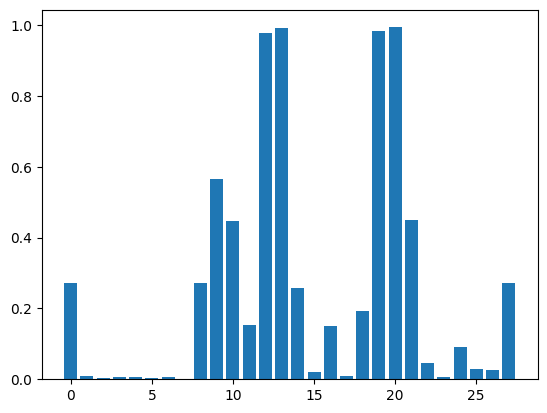

In [16]:
probs = torch.sigmoid(outputs["start_logits"])

plt.bar(x=range(0,28),height=probs[0])
plt.show()

In [17]:
tokenized_words = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

tokenized_words[12:22]

['about', '1', 'mb', '/', 'minute', ',', 'so', 'about', '6000', 'hours']

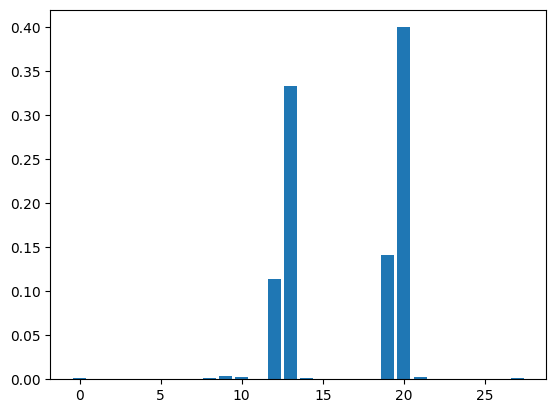

In [18]:
probs = torch.softmax(outputs["start_logits"], dim=1)

plt.bar(x=range(0,28),height=probs[0])
plt.show()

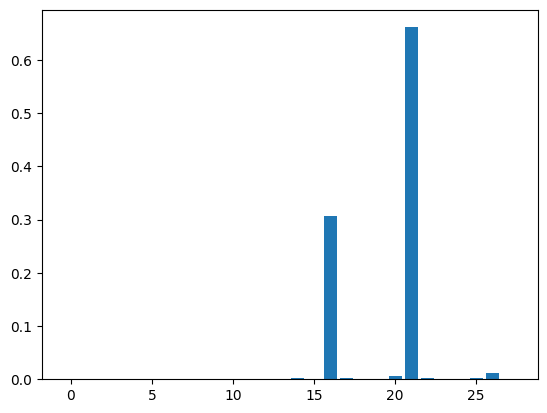

In [19]:
probs = torch.softmax(outputs["end_logits"], dim=1)

plt.bar(x=range(0,28),height=probs[0])
plt.show()

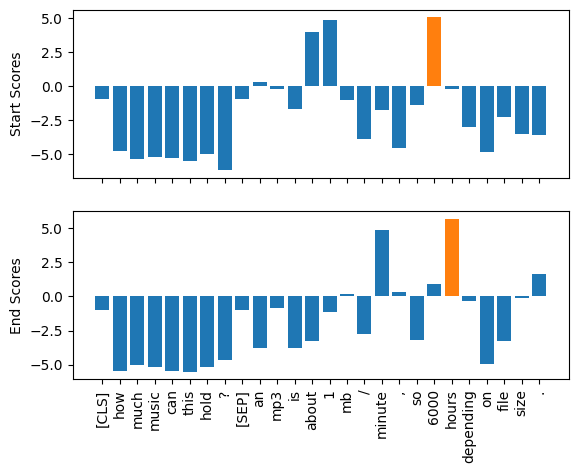

In [20]:
import numpy as np
import matplotlib.pyplot as plt

s_scores = outputs["start_logits"].detach().numpy().flatten()
e_scores = outputs["end_logits"].detach().numpy().flatten()
tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

fig, (ax1, ax2) = plt.subplots(nrows=2, sharex=True)
colors = ["C0" if s != np.max(s_scores) else "C1" for s in s_scores]
ax1.bar(x=tokens, height=s_scores, color=colors)
ax1.set_ylabel("Start Scores")
colors = ["C0" if s != np.max(e_scores) else "C1" for s in e_scores]
ax2.bar(x=tokens, height=e_scores, color=colors)
ax2.set_ylabel("End Scores")
plt.xticks(rotation="vertical")
plt.show()

In [21]:

start_idx = torch.argmax(outputs["start_logits"])  
end_idx = torch.argmax(outputs["end_logits"]) + 1  
answer_span = inputs["input_ids"][0][start_idx:end_idx]
answer = tokenizer.decode(answer_span)
print(f"Question: {question}")
print(f"Answer: {answer}")

Question: How much music can this hold?
Answer: 6000 hours


In [22]:
from transformers import pipeline

pipe = pipeline("question-answering", model=model, tokenizer=tokenizer)
pipe(question=question, context=context, topk=3)

Device set to use cuda:0
c:\Users\sshuser\NLP_for_transformers\.venv\Lib\site-packages\transformers\pipelines\question_answering.py:339: UserWarning: topk parameter is deprecated, use top_k instead
  warnings.warn("topk parameter is deprecated, use top_k instead", UserWarning)


[{'score': 0.2651635408401489, 'start': 38, 'end': 48, 'answer': '6000 hours'},
 {'score': 0.22082890570163727,
  'start': 16,
  'end': 48,
  'answer': '1 MB/minute, so about 6000 hours'},
 {'score': 0.10253399610519409,
  'start': 16,
  'end': 27,
  'answer': '1 MB/minute'}]

In [23]:
pipe(question="Why is there no data?", context=context, 
     handle_impossible_answer=True)
     

{'score': 0.9068413972854614, 'start': 0, 'end': 0, 'answer': ''}

In [24]:
example = dfs["train"].iloc[0][["question", "context"]]
tokenized_example = tokenizer(example["question"], example["context"], 
                              return_overflowing_tokens=True, max_length=100, 
                              stride=25)
     

for idx, window in enumerate(tokenized_example["input_ids"]):
    print(f"Window #{idx} has {len(window)} tokens")


Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Window #0 has 100 tokens
Window #1 has 88 tokens


In [25]:


for window in tokenized_example["input_ids"]:
    print(f"{tokenizer.decode(window)} \n")
     


[CLS] how is the bass? [SEP] i have had koss headphones in the past, pro 4aa and qz - 99. the koss portapro is portable and has great bass response. the work great with my android phone and can be " rolled up " to be carried in my motorcycle jacket or computer bag without getting crunched. they are very light and do not feel heavy or bear down on your ears even after listening to music with them on all day. the sound is [SEP] 

[CLS] how is the bass? [SEP] and do not feel heavy or bear down on your ears even after listening to music with them on all day. the sound is night and day better than any ear - bud could be and are almost as good as the pro 4aa. they are " open air " headphones so you cannot match the bass to the sealed types, but it comes close. for $ 32, you cannot go wrong. [SEP] 



In [26]:
import chromadb
from sentence_transformers import SentenceTransformer

# 1. Setup (No server management needed!)
client = chromadb.Client()
collection = client.create_collection("subjqa")



In [27]:
# 2. Add Documents (automatically converts text to vector embeddings)
embedder = SentenceTransformer('all-MiniLM-L6-v2') # Small, fast embedder

embedder

SentenceTransformer(
  (0): Transformer({'max_seq_length': 256, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)

In [28]:
tokenized_example

{'input_ids': [[101, 2129, 2003, 1996, 3321, 1029, 102, 1045, 2031, 2018, 12849, 4757, 2132, 19093, 1999, 1996, 2627, 1010, 4013, 26424, 2050, 1998, 1053, 2480, 1011, 5585, 1012, 1996, 12849, 4757, 3417, 9331, 3217, 2003, 12109, 1998, 2038, 2307, 3321, 3433, 1012, 1996, 2147, 2307, 2007, 2026, 11924, 3042, 1998, 2064, 2022, 1000, 4565, 2039, 1000, 2000, 2022, 3344, 1999, 2026, 9055, 6598, 2030, 3274, 4524, 2302, 2893, 24514, 2098, 1012, 2027, 2024, 2200, 2422, 1998, 2079, 2025, 2514, 3082, 2030, 4562, 2091, 2006, 2115, 5551, 2130, 2044, 5962, 2000, 2189, 2007, 2068, 2006, 2035, 2154, 1012, 1996, 2614, 2003, 102], [101, 2129, 2003, 1996, 3321, 1029, 102, 1998, 2079, 2025, 2514, 3082, 2030, 4562, 2091, 2006, 2115, 5551, 2130, 2044, 5962, 2000, 2189, 2007, 2068, 2006, 2035, 2154, 1012, 1996, 2614, 2003, 2305, 1998, 2154, 2488, 2084, 2151, 4540, 1011, 13007, 2071, 2022, 1998, 2024, 2471, 2004, 2204, 2004, 1996, 4013, 26424, 2050, 1012, 2027, 2024, 1000, 2330, 2250, 1000, 2132, 19093, 2061,

# Retriver

In [29]:
subjqa["train"][0]

{'domain': 'electronics',
 'nn_mod': 'great',
 'nn_asp': 'bass response',
 'query_mod': 'excellent',
 'query_asp': 'bass',
 'q_reviews_id': '0514ee34b672623dff659334a25b599b',
 'question_subj_level': 5,
 'ques_subj_score': 0.5,
 'is_ques_subjective': False,
 'review_id': '882b1e2745a4779c8f17b3d4406b91c7',
 'id': '2543d296da9766d8d17d040ecc781699',
 'title': 'B00001P4ZH',
 'context': 'I have had Koss headphones in the past, Pro 4AA and QZ-99.  The Koss Portapro is portable AND has great bass response.  The work great with my Android phone and can be "rolled up" to be carried in my motorcycle jacket or computer bag without getting crunched.  They are very light and do not feel heavy or bear down on your ears even after listening to music with them on all day.  The sound is night and day better than any ear-bud could be and are almost as good as the Pro 4AA.  They are "open air" headphones so you cannot match the bass to the sealed types, but it comes close. For $32, you cannot go wrong.

In [30]:
docs = subjqa["train"]["context"]
docs

['I have had Koss headphones in the past, Pro 4AA and QZ-99.  The Koss Portapro is portable AND has great bass response.  The work great with my Android phone and can be "rolled up" to be carried in my motorcycle jacket or computer bag without getting crunched.  They are very light and do not feel heavy or bear down on your ears even after listening to music with them on all day.  The sound is night and day better than any ear-bud could be and are almost as good as the Pro 4AA.  They are "open air" headphones so you cannot match the bass to the sealed types, but it comes close. For $32, you cannot go wrong.',
 'To anyone who hasn\'t tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they\'re good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a ru

In [31]:
len(docs)

1295

In [32]:
subjqa

DatasetDict({
    train: Dataset({
        features: ['domain', 'nn_mod', 'nn_asp', 'query_mod', 'query_asp', 'q_reviews_id', 'question_subj_level', 'ques_subj_score', 'is_ques_subjective', 'review_id', 'id', 'title', 'context', 'question', 'answers'],
        num_rows: 1295
    })
    test: Dataset({
        features: ['domain', 'nn_mod', 'nn_asp', 'query_mod', 'query_asp', 'q_reviews_id', 'question_subj_level', 'ques_subj_score', 'is_ques_subjective', 'review_id', 'id', 'title', 'context', 'question', 'answers'],
        num_rows: 358
    })
    validation: Dataset({
        features: ['domain', 'nn_mod', 'nn_asp', 'query_mod', 'query_asp', 'q_reviews_id', 'question_subj_level', 'ques_subj_score', 'is_ques_subjective', 'review_id', 'id', 'title', 'context', 'question', 'answers'],
        num_rows: 255
    })
})

In [33]:
len((docs))

1295

In [34]:
a = []
for row in docs:
    a.append(len(row.split()))

max(a)

3327

In [35]:
a

[118,
 395,
 397,
 303,
 133,
 585,
 85,
 22,
 109,
 338,
 203,
 124,
 56,
 100,
 889,
 175,
 296,
 185,
 122,
 68,
 121,
 244,
 356,
 132,
 88,
 62,
 96,
 166,
 299,
 31,
 38,
 103,
 137,
 169,
 103,
 62,
 209,
 303,
 349,
 357,
 193,
 24,
 24,
 86,
 52,
 151,
 488,
 114,
 84,
 197,
 153,
 443,
 119,
 275,
 87,
 526,
 90,
 48,
 122,
 63,
 135,
 236,
 517,
 163,
 115,
 172,
 264,
 371,
 125,
 1044,
 267,
 65,
 112,
 48,
 35,
 50,
 121,
 174,
 58,
 25,
 341,
 23,
 258,
 63,
 116,
 747,
 375,
 37,
 271,
 231,
 115,
 19,
 164,
 67,
 34,
 228,
 93,
 135,
 78,
 506,
 213,
 34,
 468,
 80,
 61,
 386,
 396,
 904,
 220,
 39,
 280,
 723,
 373,
 288,
 52,
 209,
 25,
 176,
 66,
 740,
 173,
 135,
 255,
 88,
 128,
 126,
 22,
 563,
 473,
 45,
 319,
 41,
 372,
 148,
 204,
 98,
 928,
 80,
 36,
 634,
 44,
 70,
 26,
 1149,
 207,
 101,
 101,
 172,
 46,
 119,
 130,
 55,
 109,
 78,
 57,
 74,
 448,
 268,
 67,
 67,
 852,
 218,
 87,
 114,
 47,
 83,
 52,
 174,
 52,
 230,
 32,
 182,
 305,
 114,
 216,
 130,
 137,

In [36]:
dataset_train = np.array(a)
dataset_train.argmax()

np.int64(448)

In [37]:
long_text = docs[448]
long_text

'Whether you\'re new to the world of DSLRs, or are a seasoned photographer who wants to try your luck at video, the Canon Rebel T2i is perfect. I\'ve had nothing but great experiences with it so far, and highly recommend to everyone.Other than the T2i, I own (and primarily shoot with) the Rebel XS (1000D), and also have extensive experience with the Canon 50D. While my XS still serves me very well, I wanted to get an SLR with video capabilities since the release of the T1i. After finally saving up enough for the T1i, I really lucked out that Canon announced the T2i, which has even better features! I am lucky enough to finally have it, and want to share my experiences, and how they compare to my expectations==================OVERALL IMPRESSIONSThe camera is very small and light. It is not weather-sealed or as durable as some of the more expensive SLRs, but it doesn\'t "feel cheap" in my opinion. It features a 3-inch LCD (compared to the Rebel XS\'s 2.5 inch screen), which also has a ver

In [38]:
from langchain_text_splitters import RecursiveCharacterTextSplitter

splitter = RecursiveCharacterTextSplitter(
    chunk_size=500,      # Max characters per chunk (aim for model limit)
    chunk_overlap=50,    # How many characters to repeat between chunks
    separators=["  ", " "] # Try to split by paragraph, then line, then word
)

In [39]:
# 3. Create the chunks
chunks = splitter.split_text(long_text)
chunks

["Whether you're new to the world of DSLRs, or are a seasoned photographer who wants to try your luck at video, the Canon Rebel T2i is perfect. I've had nothing but great experiences with it so far, and highly recommend to everyone.Other than the T2i, I own (and primarily shoot with) the Rebel XS (1000D), and also have extensive experience with the Canon 50D. While my XS still serves me very well, I wanted to get an SLR with video capabilities since the release of the T1i. After finally saving up",
 'the release of the T1i. After finally saving up enough for the T1i, I really lucked out that Canon announced the T2i, which has even better features! I am lucky enough to finally have it, and want to share my experiences, and how they compare to my expectations==================OVERALL IMPRESSIONSThe camera is very small and light. It is not weather-sealed or as durable as some of the more expensive SLRs, but it doesn\'t "feel cheap" in my opinion. It features a 3-inch LCD (compared to the

In [40]:
len(chunks[0].split())

91

In [41]:
def dataset2chunk(dataset):
    splitter = RecursiveCharacterTextSplitter(
    chunk_size=500,      # Max characters per chunk (aim for model limit)
    chunk_overlap=50,    # How many characters to repeat between chunks
    separators=["  ", " "] # Try to split by paragraph, then line, then word
    )
    chunks = []
    for row in dataset:
        for chunk in splitter.split_text(row):
            chunks.append(chunk)
    
    return chunks

chunks2 = dataset2chunk(docs)    
chunks2

['I have had Koss headphones in the past, Pro 4AA and QZ-99.  The Koss Portapro is portable AND has great bass response.  The work great with my Android phone and can be "rolled up" to be carried in my motorcycle jacket or computer bag without getting crunched.  They are very light and do not feel heavy or bear down on your ears even after listening to music with them on all day.  The sound is night and day better than any ear-bud could be and are almost as good as the Pro 4AA.',
 'They are "open air" headphones so you cannot match the bass to the sealed types, but it comes close. For $32, you cannot go wrong.',
 "To anyone who hasn't tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they're good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a r

In [42]:
ids = [f"chunk_{i}" for i in range(len(chunks2))]
ids

['chunk_0',
 'chunk_1',
 'chunk_2',
 'chunk_3',
 'chunk_4',
 'chunk_5',
 'chunk_6',
 'chunk_7',
 'chunk_8',
 'chunk_9',
 'chunk_10',
 'chunk_11',
 'chunk_12',
 'chunk_13',
 'chunk_14',
 'chunk_15',
 'chunk_16',
 'chunk_17',
 'chunk_18',
 'chunk_19',
 'chunk_20',
 'chunk_21',
 'chunk_22',
 'chunk_23',
 'chunk_24',
 'chunk_25',
 'chunk_26',
 'chunk_27',
 'chunk_28',
 'chunk_29',
 'chunk_30',
 'chunk_31',
 'chunk_32',
 'chunk_33',
 'chunk_34',
 'chunk_35',
 'chunk_36',
 'chunk_37',
 'chunk_38',
 'chunk_39',
 'chunk_40',
 'chunk_41',
 'chunk_42',
 'chunk_43',
 'chunk_44',
 'chunk_45',
 'chunk_46',
 'chunk_47',
 'chunk_48',
 'chunk_49',
 'chunk_50',
 'chunk_51',
 'chunk_52',
 'chunk_53',
 'chunk_54',
 'chunk_55',
 'chunk_56',
 'chunk_57',
 'chunk_58',
 'chunk_59',
 'chunk_60',
 'chunk_61',
 'chunk_62',
 'chunk_63',
 'chunk_64',
 'chunk_65',
 'chunk_66',
 'chunk_67',
 'chunk_68',
 'chunk_69',
 'chunk_70',
 'chunk_71',
 'chunk_72',
 'chunk_73',
 'chunk_74',
 'chunk_75',
 'chunk_76',
 'chunk_7

In [43]:
embeddings = embedder.encode(chunks2).tolist()
embeddings

[[-0.05853462219238281,
  0.009614609181880951,
  -0.04614166542887688,
  -0.026940105482935905,
  0.0069190869107842445,
  0.039907306432724,
  0.054604046046733856,
  0.07942423224449158,
  -0.030350737273693085,
  0.08623145520687103,
  0.02260798029601574,
  0.04470401257276535,
  -0.02161390706896782,
  0.010190458036959171,
  0.027727598324418068,
  -0.007995779626071453,
  0.07373970001935959,
  -0.0761907622218132,
  0.033038344234228134,
  0.03955591842532158,
  -0.10881564766168594,
  -0.00477550458163023,
  0.0424872562289238,
  0.029090411961078644,
  0.0037350128404796124,
  0.0006520182359963655,
  -0.022142009809613228,
  0.07622024416923523,
  0.05090968683362007,
  -0.05167480930685997,
  0.005066368728876114,
  0.06981851905584335,
  -0.01836329512298107,
  -0.07550948858261108,
  -0.06902844458818436,
  0.022868558764457703,
  0.06811702996492386,
  -0.04176914691925049,
  -0.054704517126083374,
  0.02535885013639927,
  0.046489130705595016,
  0.08366668224334717,
  

In [44]:
len(embeddings)

4658

In [45]:
collection.add(
    documents=chunks2,
    embeddings=embeddings,
    ids=ids
)
collection

Collection(name=subjqa)

In [46]:
sample = subjqa["train"][1]
sample

{'domain': 'electronics',
 'nn_mod': 'harsh',
 'nn_asp': 'high',
 'query_mod': 'not strong',
 'query_asp': 'bass',
 'q_reviews_id': '7c46670208f7bf5497480fbdbb44561a',
 'question_subj_level': 1,
 'ques_subj_score': 0.5,
 'is_ques_subjective': False,
 'review_id': 'ce76793f036494eabe07b33a9a67288a',
 'id': 'd476830bf9282e2b9033e2bb44bbb995',
 'title': 'B00001P4ZH',
 'context': 'To anyone who hasn\'t tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they\'re good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a run on both my computer\'s sound card and mp3 player, using 256 kbps mp3s or better. The clarity is good and they\'re very lightweight. The folding design is simple but effective. The look is certainly retro and unique, although I didn\'t fi

In [47]:
question = sample["question"]
print(f"{question=}")

question_emb = embedder.encode([question])
question_emb.shape


question='Is this music song have a goo bass?'


(1, 384)

In [48]:
results = collection.query(
    query_embeddings=question_emb,
    n_results=5
)
results

{'ids': [['chunk_4039',
   'chunk_1048',
   'chunk_1552',
   'chunk_1553',
   'chunk_1593']],
 'embeddings': None,
 'documents': [["The bass isn't very strong, but still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, sounds so perfect that this track could easily have been mixed using the M100 headphone.",
   "tones beginning at 0:18 are fairly soft, and while the bass isn't very deep, it still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, works very well with this track.",
   'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.',
   'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pa

In [49]:
retrieved_docs = results['documents'][0]
retrieved_docs

["The bass isn't very strong, but still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, sounds so perfect that this track could easily have been mixed using the M100 headphone.",
 "tones beginning at 0:18 are fairly soft, and while the bass isn't very deep, it still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, works very well with this track.",
 'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.',
 'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.',
 'Great headphones this is my second time buying them, these headphone are perfect if you looking for headphones with some bas

# Reader (Reranker)

## answer-extractor

In [50]:
from transformers import pipeline

# The 2026 standard for Extractive QA
model_name = "deepset/deberta-v3-base-squad2" 

reader = pipeline("question-answering", model=model_name, tokenizer=model_name)

Device set to use cuda:0


In [51]:
question

'Is this music song have a goo bass?'

In [52]:
answer = []
for doc in retrieved_docs:
    output = reader(question=question, context=doc)
    
    print(output)

{'score': 0.12024704273790121, 'start': 0, 'end': 27, 'answer': "The bass isn't very strong,"}
{'score': 0.19274353422224522, 'start': 50, 'end': 76, 'answer': " the bass isn't very deep,"}
{'score': 0.9081636304035783, 'start': 39, 'end': 77, 'answer': ' the bass is practically non-existent.'}
{'score': 0.9081636304035783, 'start': 39, 'end': 77, 'answer': ' the bass is practically non-existent.'}
{'score': 0.602922085672617, 'start': 72, 'end': 126, 'answer': ' perfect if you looking for headphones with some bass.'}


In [53]:

output

{'score': 0.602922085672617,
 'start': 72,
 'end': 126,
 'answer': ' perfect if you looking for headphones with some bass.'}

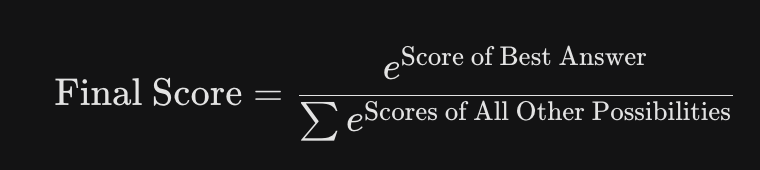

## LLM

In [54]:
retrieved_docs

["The bass isn't very strong, but still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, sounds so perfect that this track could easily have been mixed using the M100 headphone.",
 "tones beginning at 0:18 are fairly soft, and while the bass isn't very deep, it still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, works very well with this track.",
 'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.',
 'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.',
 'Great headphones this is my second time buying them, these headphone are perfect if you looking for headphones with some bas

In [55]:
context = retrieved_docs

In [56]:
question

'Is this music song have a goo bass?'

In [57]:
prompt = f"""
Answer the question based strictly on the context below.
Context: {context}
Question: {question}
Answer:
"""

In [58]:
print(prompt)


Answer the question based strictly on the context below.
Context: ["The bass isn't very strong, but still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, sounds so perfect that this track could easily have been mixed using the M100 headphone.", "tones beginning at 0:18 are fairly soft, and while the bass isn't very deep, it still adds a good underpinning to the music. The short poetic rap at 4:14, preceded by an etherial female voice, works very well with this track.", 'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.', 'Although the sound is nice and neutral, the bass is practically non-existent. The fit, with the right rubber socks, is fine. It stays in your ears while moving. I suppose you gets what you pays for.', 'Great headphones this is my second time buying them, these he

In [59]:
from google import genai

client = genai.Client()

stream = client.interactions.create(
    model="gemini-3-flash-preview",
    input=prompt,
    stream=True
)

for chunk in stream:
    if chunk.event_type == "content.delta":
        if chunk.delta.type == "text":
            print(chunk.delta.text, end="", flush=True)
        elif chunk.delta.type == "thought":
            print(chunk.delta.thought, end="", flush=True)
    elif chunk.event_type == "interaction.complete":
        print(f"\n\n--- Stream Finished ---")
        print(f"Total Tokens: {chunk.interaction.usage.total_tokens}")


ValueError: Missing key inputs argument! To use the Google AI API, provide (`api_key`) arguments. To use the Google Cloud API, provide (`vertexai`, `project` & `location`) arguments.

In [60]:
sample

{'domain': 'electronics',
 'nn_mod': 'harsh',
 'nn_asp': 'high',
 'query_mod': 'not strong',
 'query_asp': 'bass',
 'q_reviews_id': '7c46670208f7bf5497480fbdbb44561a',
 'question_subj_level': 1,
 'ques_subj_score': 0.5,
 'is_ques_subjective': False,
 'review_id': 'ce76793f036494eabe07b33a9a67288a',
 'id': 'd476830bf9282e2b9033e2bb44bbb995',
 'title': 'B00001P4ZH',
 'context': 'To anyone who hasn\'t tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they\'re good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a run on both my computer\'s sound card and mp3 player, using 256 kbps mp3s or better. The clarity is good and they\'re very lightweight. The folding design is simple but effective. The look is certainly retro and unique, although I didn\'t fi

In [61]:
import string
import collections

def normalize_text(text):
    """Standard SQuAD normalization: Lowercase, remove punc/articles/whitespace."""
    if not text:
        return ""
    # 1. Lowercase
    text = text.lower()
    # 2. Remove punctuation
    exclude = set(string.punctuation)
    text = "".join(ch for ch in text if ch not in exclude)
    # 3. Remove articles (a, an, the)
    regex = set(['a', 'an', 'the'])
    text = " ".join([word for word in text.split() if word not in regex])
    # 4. Fix whitespace
    return " ".join(text.split())


In [62]:

def calculate_recall(prediction, ground_truth):
    """
    Calculates Recall: What % of the Truth words are in the Prediction?
    Formula: (Matching Words) / (Total Words in Truth)
    """
    pred_tokens = normalize_text(prediction).split()
    truth_tokens = normalize_text(ground_truth).split()

    # Case 1: If Ground Truth is empty (e.g., unanswerable question)
    # If prediction is also empty -> Perfect Recall (1.0)
    # If prediction has text -> Wrong (0.0)
    if len(truth_tokens) == 0:
        return 1.0 if len(pred_tokens) == 0 else 0.0

    # Case 2: Count the matches
    common_tokens = collections.Counter(pred_tokens) & collections.Counter(truth_tokens)
    num_same = sum(common_tokens.values())

    # Recall Calculation
    recall = num_same / len(truth_tokens)
    return recall

In [63]:
true_answer = sample["answers"]["text"][0]
pred_answer = "the bass is practically non-existent."

In [64]:
true_answer

'Bass is weak as expected'

In [65]:
calculate_recall(pred_answer,true_answer)

0.4

In [66]:
pred_answer_norm = normalize_text(pred_answer).split()
pred_answer_norm

['bass', 'is', 'practically', 'nonexistent']

In [67]:
collections.Counter(pred_answer_norm)

Counter({'bass': 1, 'is': 1, 'practically': 1, 'nonexistent': 1})

In [97]:
def run_qa_pipeline(question, top_k_retriever=3, top_k_reader=3):
    
    # --- PHASE A: RETRIEVE ---
    # 1. Convert question to vector
    query_emb = embedder.encode([question]).tolist()
    
    # 2. Ask ChromaDB for the best documents
    results = collection.query(
        query_embeddings=query_emb,
        n_results=top_k_retriever
    )
    
    # Chroma returns a list of lists, we just want the documents
    retrieved_docs = results['documents'][0]
    
    # --- PHASE B: READ ---
    answers = []
    for doc in retrieved_docs:
        # Ask the Reader to look at THIS specific document
        prediction = reader(question=question, context=doc)
        
        # We save the answer only if the model is somewhat confident
        if prediction['score'] > 0.1: # Filter out bad guesses
            answers.append({
                "answer": prediction['answer'],
                "score": prediction['score'],
                "context": doc
            })
    
    # --- PHASE C: SORT & FILTER ---
    # Sort answers by highest confidence score
    sorted_answers = sorted(answers, key=lambda x: x['score'], reverse=True)
    
    return sorted_answers[:top_k_reader]



In [82]:
subjqa["train"]["answers"]

[{'text': [],
  'answer_start': [],
  'answer_subj_level': [],
  'ans_subj_score': [],
  'is_ans_subjective': []},
 {'text': ['Bass is weak as expected',
   'Bass is weak as expected, even with EQ adjusted up'],
  'answer_start': [1302, 1302],
  'answer_subj_level': [1, 1],
  'ans_subj_score': [0.5083333253860474, 0.5083333253860474],
  'is_ans_subjective': [True, True]},
 {'text': ['The only fault in the sound is the bass'],
  'answer_start': [650],
  'answer_subj_level': [2],
  'ans_subj_score': [0.6333333253860474],
  'is_ans_subjective': [True]},
 {'text': ['the best of all of them'],
  'answer_start': [1609],
  'answer_subj_level': [1],
  'ans_subj_score': [0.30000001192092896],
  'is_ans_subjective': [False]},
 {'text': ['The sound is so crisp', 'crazy obsession with sound and music'],
  'answer_start': [141, 38],
  'answer_subj_level': [1, 1],
  'ans_subj_score': [0.40833333134651184, 0.40833333134651184],
  'is_ans_subjective': [False, False]},
 {'text': ['that had terrible bas

In [ ]:
train_metric_dataset = []

for row in subjqa["train"]:
    if len(row["answers"]["text"]) != 0:

        train_metric_dataset.append(row)


[['Bass is weak as expected',
  'Bass is weak as expected, even with EQ adjusted up'],
 ['The only fault in the sound is the bass'],
 ['the best of all of them'],
 ['The sound is so crisp', 'crazy obsession with sound and music'],
 ['that had terrible bass', 'This is my first review for the Sony MDR'],
 ['The instructions were clear'],
 ['strap is fairly', 'the bass is awesome'],
 ['comfortable', 'The earphones are fairly comfortable'],
 ['crystal clear and BIG. Bass booms'],
 ['expensive but terrible set of headphones', 'terrible set of headphones'],
 ['absolutely mind blowing',
  'Music is crisp and clear and base can be felt in your bones'],
 ["These headphones aren't very"],
 ['super simple', 'the power to the hub'],
 ['These headphones were too big',
  'These headphones were too big for my head'],
 ['The headphones are comfortable'],
 ['The image quality is amazing at this price point',
  'The image quality is amazing at this price point'],
 ['a nice low cost piece to your photogr

In [95]:
train_metric_dataset

[{'domain': 'electronics',
  'nn_mod': 'harsh',
  'nn_asp': 'high',
  'query_mod': 'not strong',
  'query_asp': 'bass',
  'q_reviews_id': '7c46670208f7bf5497480fbdbb44561a',
  'question_subj_level': 1,
  'ques_subj_score': 0.5,
  'is_ques_subjective': False,
  'review_id': 'ce76793f036494eabe07b33a9a67288a',
  'id': 'd476830bf9282e2b9033e2bb44bbb995',
  'title': 'B00001P4ZH',
  'context': 'To anyone who hasn\'t tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they\'re good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a run on both my computer\'s sound card and mp3 player, using 256 kbps mp3s or better. The clarity is good and they\'re very lightweight. The folding design is simple but effective. The look is certainly retro and unique, although

In [106]:
sum_recal = 0
for row in train_metric_dataset:
    top_k_answers = run_qa_pipeline(row["question"], top_k_retriever=3, top_k_reader=3)
    if len(top_k_answers) == 0:
        pred_answer = top_k_answers
    else:
        pred_answer = top_k_answers[0]["answer"]
    true_answers = row["answers"]["text"]
    max_recalls = []
    for true_answer in true_answers:
        max_recalls.append(calculate_recall(pred_answer, true_answer))
    sum_recal += max(max_recalls)
sum_recal / len(train_metric_dataset)

0.057901213863503394

In [112]:
from datasets import load_metric

# 1. Load the official SQuAD metric
metric = load_metric("squad", trust_remote_code=True)

predictions = []
references = []
for row in train_metric_dataset:
    top_k_answers = run_qa_pipeline(row["question"], top_k_retriever=3, top_k_reader=3)
    if len(top_k_answers) == 0:
        pred_answer = top_k_answers
    else:
        pred_answer = top_k_answers
    predictions.append(pred_answer)
    references.append(row["answers"])


In [117]:
def evaluate_retriever(k_values):
    results = []
    
    for k in k_values:
        sum_recal = 0
        total_queries = len(train_metric_dataset)
        
        for row in train_metric_dataset:
            top_k_answers = run_qa_pipeline(row["question"], top_k_retriever=k, top_k_reader=3)
            if len(top_k_answers) == 0:
                pred_answer = top_k_answers
            else:
                pred_answer = top_k_answers[0]["answer"]
            true_answers = row["answers"]["text"]
            max_recalls = []
            for true_answer in true_answers:
                max_recalls.append(calculate_recall(pred_answer, true_answer))
            sum_recal += max(max_recalls) 
        # Calculate Recall@k
        recall = sum_recal / total_queries
        results.append({"k": k, "recall": recall})
    
    return pd.DataFrame(results).set_index("k")

# Run evaluation for k = 1, 2, 3, 4, 5
df_results = evaluate_retriever([1, 2, 3, 4, 5])
print(df_results)

     recall
k          
1  0.059945
2  0.055895
3  0.057901
4  0.061547
5  0.062258


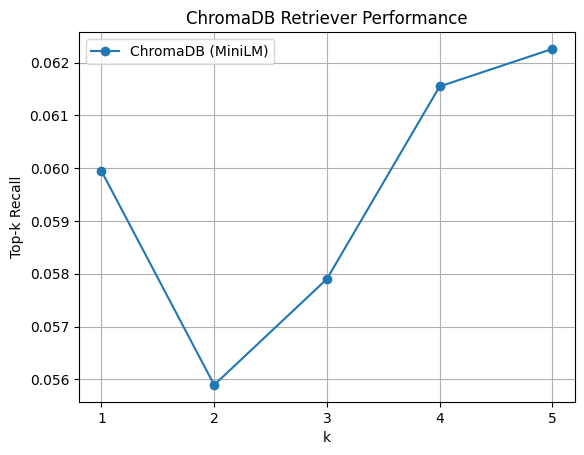

In [118]:
def plot_retriever_eval(dfs, retriever_names):
    fig, ax = plt.subplots()
    for df, retriever_name in zip(dfs, retriever_names):
        df.plot(y="recall", ax=ax, label=retriever_name, marker='o') # Added marker for clarity
    plt.xticks(df.index)
    plt.ylabel("Top-k Recall")
    plt.xlabel("k")
    plt.title("ChromaDB Retriever Performance")
    plt.grid(True) # Added grid to look nicer
    plt.show()

# Run the plot
plot_retriever_eval([df_results], ["ChromaDB (MiniLM)"])

In [127]:
docs2 = []
ids2 = []
for row in train_metric_dataset:
    docs2.append(row["context"])
    ids2.append(row["id"])

docs2, ids2

(['To anyone who hasn\'t tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they\'re good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a run on both my computer\'s sound card and mp3 player, using 256 kbps mp3s or better. The clarity is good and they\'re very lightweight. The folding design is simple but effective. The look is certainly retro and unique, although I didn\'t find it as comfortable as many have claimed. Earpads are *very* thin and made my ears sore after 30 minutes of listening, although this can be remedied to a point by adjusting the "comfort zone" feature (tightening the temple pads while loosening the ear pads). The cord seems to be an average thickness, but I wouldn\'t get too rough with these. The steel headband adjusts smoot

In [ ]:
collection2 = client.create_collection("idx_match")

In [ ]:


embeddings = embedder.encode(docs2).tolist()

collection2.add(
    documents=docs2,
    embeddings=embeddings,
    ids=ids2
)


In [136]:
import pandas as pd

def evaluate_retriever_correctly(k_values):
    results = []
    
    # Pre-calculate embeddings for speed (optional, but good for large loops)
    # or just run inside the loop if dataset is small.
    
    for k in k_values:
        correct_retrievals = 0
        total_queries = len(train_metric_dataset)
        
        for row in train_metric_dataset:
            question = row["question"]
            
            # The ID of the document that actually contains the answer
            # In SubjQA/Book, this is usually 'review_id' or 'title' depending on how you indexed it.
            # MAKE SURE this matches the IDs you used in collection.add(ids=...)
            target_doc_id = row["id"] 
            
            # 1. RETRIEVE ONLY (Don't run the Reader)
            query_emb = embedder.encode([question]).tolist()
            chroma_response = collection2.query(
                query_embeddings=query_emb,
                n_results=k
            )
            
            # Get the list of IDs found by Chroma
            found_ids = chroma_response['ids'][0]
            
            # 2. CHECK IF CORRECT DOC IS FOUND
            if target_doc_id in found_ids:
                correct_retrievals += 1
        
        # Calculate Recall@k
        recall = correct_retrievals / total_queries
        results.append({"k": k, "recall": recall})
    
    return pd.DataFrame(results).set_index("k")

# This should give you a nice curve like: 0.50 -> 0.60 -> 0.70...
df_results = evaluate_retriever_correctly([1,2,3,4,5,6,7,8,9,10])
print(df_results)

      recall
k           
1   0.060665
2   0.088063
3   0.119374
4   0.148728
5   0.178082
6   0.203523
7   0.219178
8   0.230920
9   0.240705
10  0.244618


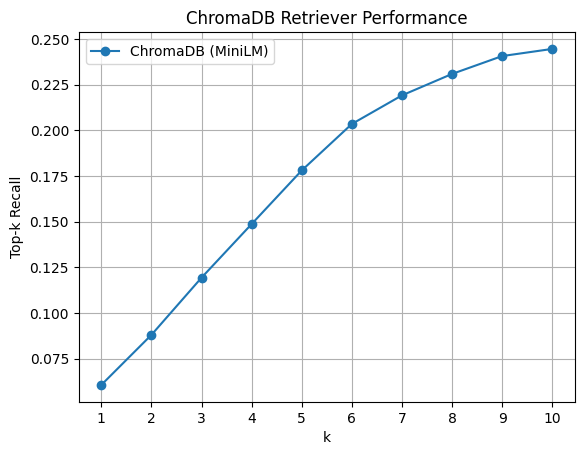

In [138]:
# Run the plot
plot_retriever_eval([df_results], ["ChromaDB (MiniLM)"])

In [144]:
dataset_df = pd.DataFrame(train_metric_dataset)
dataset_df.head(4)

,domain,nn_mod,nn_asp,query_mod,query_asp,q_reviews_id,question_subj_level,ques_subj_score,is_ques_subjective,review_id,id,title,context,question,answers
0,electronics,harsh,high,not strong,bass,7c46670208f7bf5497480fbdbb44561a,1,0.50,False,ce76793f036494eabe07b33a9a67288a,d476830bf9282e2b9033e2bb44bbb995,B00001P4ZH,To anyone who hasn't tried all the various typ...,Is this music song have a goo bass?,"{'text': ['Bass is weak as expected', 'Bass is..."
1,electronics,neutral,sound,present,bass,8fbf26792c438aa83178c2d507af5d77,1,0.50,False,d040f2713caa2aff0ce95affb40e12c2,455575557886d6dfeea5aa19577e5de4,B00001P4ZH,I have had many sub-$100 headphones from $5 Pa...,How is the bass?,{'text': ['The only fault in the sound is the ...
2,electronics,muddy,bass,awesome,bass,9876fd06ed8f075fcad70d1e30e7e8be,1,0.50,False,043e7162df91f6ea916c790c8a6f6b22,6895a59b470d8feee0f39da6c53a92e5,B00001WRSJ,My sister's Bose headphones finally died and s...,How is the audio bass?,"{'text': ['the best of all of them'], 'answer_..."
3,electronics,perfect,bass,incredible,sound,16506b53e2d4c2b6a65881d9462256c2,1,0.65,True,29ccd7e690050e2951be49289e915382,7a2173c502da97c5bd5950eae7cd7430,B00001WRSJ,Wow. Just wow. I'm a 22 yr old with a crazy ob...,Why do I have an incredible sound?,"{'text': ['The sound is so crisp', 'crazy obse..."


In [148]:
# Find rows with the same review_id
for i in range(len(dataset_df)):
    if len(dataset_df[dataset_df['review_id'] == dataset_df.iloc[i]['review_id']]) != 1:
        print(dataset_df[dataset_df['review_id'] == dataset_df.iloc[i]['review_id']])

         domain nn_mod nn_asp query_mod query_asp  \
64  electronics  great   port       dim     light   
65  electronics  great   port      more      port   

                        q_reviews_id  question_subj_level  ques_subj_score  \
64  0dd2d120f1dfa4c83df22c36180046c5                    5              0.7   
65  61351e11d42e6ca2ec81b4a7fae75309                    1              0.0   

    is_ques_subjective                         review_id  \
64                True  25d45ae08585bb796bdbee466a2cd947   
65               False  25d45ae08585bb796bdbee466a2cd947   

                                  id       title  \
64  13390d3083d80eabd9f72b31da224b5e  B000N99BBC   
65  2067a30dd80889d9f2d408bab9c93dda  B000N99BBC   

                                              context  \
64  I bought this little switch to expand my home ...   
65  I bought this little switch to expand my home ...   

                                             question  \
64  How can I get light in the bathroo

In [152]:
test_sample = dataset_df.loc[64:65,:]
test_sample

,domain,nn_mod,nn_asp,query_mod,query_asp,q_reviews_id,question_subj_level,ques_subj_score,is_ques_subjective,review_id,id,title,context,question,answers
64,electronics,great,port,dim,light,0dd2d120f1dfa4c83df22c36180046c5,5,0.7,True,25d45ae08585bb796bdbee466a2cd947,13390d3083d80eabd9f72b31da224b5e,B000N99BBC,I bought this little switch to expand my home ...,How can I get light in the bathroom of this ho...,"{'text': ['six'], 'answer_start': [282], 'answ..."
65,electronics,great,port,more,port,61351e11d42e6ca2ec81b4a7fae75309,1,0.0,False,25d45ae08585bb796bdbee466a2cd947,2067a30dd80889d9f2d408bab9c93dda,B000N99BBC,I bought this little switch to expand my home ...,What happens to the ports if you plug it in?,{'text': ['It perfectly detects the speed each...


In [168]:
dataset_train2 = []
docs2 = []
ids2 = []
for row in train_metric_dataset:
    docs2.append(row["context"])
    ids2.append(row["review_id"])
    dataset_train2.append({"context": row["context"],
                           "review_id": row["review_id"]})

dataset_train2_df = pd.DataFrame(dataset_train2)
dataset_train2_df

,context,review_id
0,To anyone who hasn't tried all the various typ...,ce76793f036494eabe07b33a9a67288a
1,I have had many sub-$100 headphones from $5 Pa...,d040f2713caa2aff0ce95affb40e12c2
2,My sister's Bose headphones finally died and s...,043e7162df91f6ea916c790c8a6f6b22
3,Wow. Just wow. I'm a 22 yr old with a crazy ob...,29ccd7e690050e2951be49289e915382
4,"Hello, This is my first review for the Sony MD...",deb36e2a474c0eb4b67356d8c423435b
...,...,...
506,I have been extremely pleased with Brainwavz S...,b4b54e67b3b3ac2f8f7354476534da74
507,I've owned several brands of IEMs that I use m...,e074c9f4aaa1f7da52caa662d6a5fd89
508,It is thin enough to fully take advantage of t...,eb629bc152914bc2ef73b996762e0737
509,Edit 4/21/14. I finally caved and purchased a ...,e856d7e5351e3385b5d75f06562e905b


In [179]:
# Find rows with the same review_id
duplicate_ids = []
for i in range(len(dataset_train2_df)):
    if len(dataset_train2_df[dataset_train2_df['review_id'] == dataset_train2_df.iloc[i]['review_id']]) != 1:
        duplicate_ids.append(i)

duplicate_ids

[64, 65, 125, 126, 130, 131, 196, 197, 371, 372]

In [170]:
collection3 = client.create_collection("recall_test")

In [186]:
dataset_train2_df_clean = dataset_train2_df[~dataset_train2_df.index.isin(duplicate_ids)]
dataset_train2_df_clean

,context,review_id
0,To anyone who hasn't tried all the various typ...,ce76793f036494eabe07b33a9a67288a
1,I have had many sub-$100 headphones from $5 Pa...,d040f2713caa2aff0ce95affb40e12c2
2,My sister's Bose headphones finally died and s...,043e7162df91f6ea916c790c8a6f6b22
3,Wow. Just wow. I'm a 22 yr old with a crazy ob...,29ccd7e690050e2951be49289e915382
4,"Hello, This is my first review for the Sony MD...",deb36e2a474c0eb4b67356d8c423435b
...,...,...
506,I have been extremely pleased with Brainwavz S...,b4b54e67b3b3ac2f8f7354476534da74
507,I've owned several brands of IEMs that I use m...,e074c9f4aaa1f7da52caa662d6a5fd89
508,It is thin enough to fully take advantage of t...,eb629bc152914bc2ef73b996762e0737
509,Edit 4/21/14. I finally caved and purchased a ...,e856d7e5351e3385b5d75f06562e905b


In [ ]:
dataset_train2_df_clean.loc[:,"context"].values

array(['To anyone who hasn\'t tried all the various types of headphones, it is important to remember exactly what these are: cheap portable on-ear headphones. They give a totally different sound then in-ears or closed design phones, but for what they are I would say they\'re good. I currently own six pairs of phones, from stock apple earbuds to Sennheiser HD 518s. Gave my Portapros a run on both my computer\'s sound card and mp3 player, using 256 kbps mp3s or better. The clarity is good and they\'re very lightweight. The folding design is simple but effective. The look is certainly retro and unique, although I didn\'t find it as comfortable as many have claimed. Earpads are *very* thin and made my ears sore after 30 minutes of listening, although this can be remedied to a point by adjusting the "comfort zone" feature (tightening the temple pads while loosening the ear pads). The cord seems to be an average thickness, but I wouldn\'t get too rough with these. The steel headband adjusts 

In [211]:
docs3 = dataset_train2_df_clean.loc[:,"context"].values.tolist()
ids3 = dataset_train2_df_clean.loc[:,"review_id"].values.tolist()


In [213]:
review_ids = []
for idx in ids3:
    review_ids.append({"review_id": idx})

review_ids

[{'review_id': 'ce76793f036494eabe07b33a9a67288a'},
 {'review_id': 'd040f2713caa2aff0ce95affb40e12c2'},
 {'review_id': '043e7162df91f6ea916c790c8a6f6b22'},
 {'review_id': '29ccd7e690050e2951be49289e915382'},
 {'review_id': 'deb36e2a474c0eb4b67356d8c423435b'},
 {'review_id': '2afef97a4eea62711e180dbef3068483'},
 {'review_id': '0a21c44722ba8e9424ec5b3e9abf6ea2'},
 {'review_id': '9e4e7d71dbee41f878d5749d6fc0075a'},
 {'review_id': '12896447561b4f7947c99f5cccdedc7b'},
 {'review_id': '1c733fd993be13720df7b9566bd71fcc'},
 {'review_id': 'd8f01011a13949c14bfa0e5c55ff79dc'},
 {'review_id': '60c6697a739e00f7dbbda9adb20a1f34'},
 {'review_id': 'eba4bd4d6719ad1a877b5edcafbbc50b'},
 {'review_id': 'beb86b4aac7d896cf638f38f41434780'},
 {'review_id': 'ec3b41c4bd382413092305f42e6dafb8'},
 {'review_id': 'e51931bb5fefcc11d3eed58dbb2f8e8d'},
 {'review_id': '076ff590d4571cd1e9fb2975297a8c99'},
 {'review_id': '2981c3a873d624fe82e6c867f15c925d'},
 {'review_id': '9f8869ddd92ade59a4db128972492c67'},
 {'review_id

In [215]:

embeddings = embedder.encode(docs3)

collection3.add(
    documents=docs3,
    embeddings=embeddings,
    ids=ids3,
    metadatas=review_ids
    
)

In [ ]:
for key, row in test_sample.iterrows():
    print(row["context"])
    # question_emb = embedder.encode([row["question"]])
    # collection2.query(
    #     query_embeddings=question_emb,
    #     n_results=3,
        
    # )

I bought this little switch to expand my home LAN. There is no really setup, just plugged it to one of my router's ports, hooked up the power supply and it was ready to go. It's eight ports are great, you can use any one as the up-link without any special configuration. I am using six out of its eight ports, one for up-link and the others for attached devices. It perfectly detects the speed each device is capable to achieve and the LED's illuminated accordingly. It is very well build, has a solid and durable feeling. No complains, at all.
I bought this little switch to expand my home LAN. There is no really setup, just plugged it to one of my router's ports, hooked up the power supply and it was ready to go. It's eight ports are great, you can use any one as the up-link without any special configuration. I am using six out of its eight ports, one for up-link and the others for attached devices. It perfectly detects the speed each device is capable to achieve and the LED's illuminated a

In [ ]:
def evaluate_retriever(k_values):
    results = []
    
    for k in k_values:
        sum_recal = 0
        total_queries = len(train_metric_dataset)
        
        for row in train_metric_dataset:
            top_k_answers = run_qa_pipeline(row["question"], top_k_retriever=k, top_k_reader=3)
            if len(top_k_answers) == 0:
                pred_answer = top_k_answers
            else:
                pred_answer = top_k_answers[0]["answer"]
            true_answers = row["answers"]["text"]
            max_recalls = []
            for true_answer in true_answers:
                max_recalls.append(calculate_recall(pred_answer, true_answer))
            sum_recal += max(max_recalls) 
        # Calculate Recall@k
        recall = sum_recal / total_queries
        results.append({"k": k, "recall": recall})
    
    return pd.DataFrame(results).set_index("k")

In [225]:
def evaluate_retriever_correctly(k_values):
    results = []
    
    # Pre-calculate embeddings for speed (optional, but good for large loops)
    # or just run inside the loop if dataset is small.
    
    for k in k_values:
        sum_recal = 0
        total_queries = len(train_metric_dataset)
        
        for row in train_metric_dataset:
            question = row["question"]
            
            # The ID of the document that actually contains the answer
            # In SubjQA/Book, this is usually 'review_id' or 'title' depending on how you indexed it.
            # MAKE SURE this matches the IDs you used in collection.add(ids=...)
            target_doc_id = row["review_id"] 
            
            # 1. RETRIEVE ONLY (Don't run the Reader)
            query_emb = embedder.encode([question]).tolist()
            chroma_answer = collection3.query(
                query_embeddings=query_emb,
                n_results=k,
                where={"review_id": target_doc_id},
            )
            # print(chroma_answer)

            if(len(chroma_answer["ids"][0]) == 0):
                continue

            answer = reader(question=question, context=chroma_answer["documents"][0][0])
            # print(answer)

            

            if answer["score"] > 0.1:
                pred_answer = answer["answer"]
            else:
                pred_answer = ""
                
            true_answers = row["answers"]["text"]
            max_recalls = []
            for true_answer in true_answers:
                max_recalls.append(calculate_recall(pred_answer, true_answer))
            sum_recal += max(max_recalls) 
            
            
        
        # Calculate Recall@k
        recall = sum_recal / total_queries
        results.append({"k": k, "recall": recall})
    
    return pd.DataFrame(results).set_index("k")

# This should give you a nice curve like: 0.50 -> 0.60 -> 0.70...
df_results = evaluate_retriever_correctly([1,2,3,4,5,6,7,8,9,10])
print(df_results)

    recall
k         
1   0.2626
2   0.2626
3   0.2626
4   0.2626
5   0.2626
6   0.2626
7   0.2626
8   0.2626
9   0.2626
10  0.2626
